## Coupled reactions: `S <-> P` , `E + S <-> ES*`, and  `ES* <-> E + P`
A direct reaction and the same reaction, catalyzed and showing the transient intermediate state
# Variation of experiment enzyme_3
### Re-run from same initial concentrations of S ("Substrate") and P ("Product"), for various concentations of the enzyme `E`: from zero to hugely abundant  
#### Given the initial [S]=20 and P=[0], the times at which [S] = [P] are computed for various concentrations of `E`

1. No enzyme `E`  
2. [E] = 0.2  (1/100 of the initial [S])  
3. [E] = 1  
4. [E] = 5  
5. [E] = 20  
6. [E] = 30  
7. [E] = 100  
8. [E] = 2000  

LAST REVISED: May 27, 2024  (using v. 1.0beta32)

In [1]:
import set_path      # Importing this module will add the project's home directory to sys.path

Added 'D:\Docs\- MY CODE\BioSimulations\life123-Win7' to sys.path


In [2]:
from src.modules.chemicals.chem_data import ChemData
from src.modules.reactions.reaction_dynamics import ReactionDynamics
from src.modules.movies.movies import MovieTabular

import pandas as pd
import plotly.express as px

In [3]:
# Initialize the system
chem_data = ChemData(names=["S", "P", "E", "ES*"])
                                                     
# Reaction S <-> P , with 1st-order kinetics, favorable thermodynamics in the forward direction, 
# and a forward rate that is much slower than it would be with the enzyme - as seen in the next reaction, below
chem_data.add_reaction(reactants="S", products="P",
                       forward_rate=1., delta_G=-3989.73)

     
# Reaction E + S <-> ES* , with 1st-order kinetics, and a forward rate that is much faster than it was without the enzyme
# Thermodynamically, the forward direction is at a disadvantage (higher energy state) because of the activation barrier in forming the transient state ES*
chem_data.add_reaction(reactants=["E", "S"], products=["ES*"],
                       forward_rate=100., delta_G=2000)                           
                                                      
# Reaction ES* <-> E + P , with 1st-order kinetics, and a forward rate that is much faster than it was without the enzyme
# Thermodynamically, the total energy change of this reaction and the previous one adds up to the same value as the reaction without the enzyme (-3989.73)
chem_data.add_reaction(reactants=["ES*"], products=["E", "P"],
                       forward_rate=200., delta_G=-5989.73)

# NOTE: the forward_rate's of the last 2 reactions (the catalyzed ones) were tweaked, 
#       to lead to a crossover point [S] = [P] at about the same time as in experiment `enzyme3`, in step 2 (when [E] = 0.2)

chem_data.describe_reactions()

Number of reactions: 3 (at temp. 25 C)
0: S <-> P  (kF = 1 / kR = 0.2 / delta_G = -3,989.7 / K = 5) | 1st order in all reactants & products
1: E + S <-> ES*  (kF = 100 / kR = 224.07 / delta_G = 2,000 / K = 0.44629) | 1st order in all reactants & products
2: ES* <-> E + P  (kF = 200 / kR = 17.851 / delta_G = -5,989.7 / K = 11.204) | 1st order in all reactants & products
Set of chemicals involved in the above reactions: {'ES*', 'S', 'P', 'E'}


Note that `E` is not labeled as an "enzyme" because it doesn't appear as a catalyst in any of the registered reactions; it only becomes an enzyme in the context of the _compound_ reaction from (2) and (3)

# 1. Set the initial concentrations of all the chemicals - starting with no enzyme

In [4]:
dynamics = ReactionDynamics(chem_data=chem_data)
dynamics.set_conc(conc={"S": 20., "P": 0., "E": 0., "ES*": 0.},
                  snapshot=True)      # Initially, no enzyme `E`
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 0.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'S', 'P', 'E'}


### Advance the reactions (for now without enzyme) to equilibrium

In [5]:
dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

# This setting is a preset that can be adjusted make the time resolution finer or coarser;
# it will stay in effect from now on, unless explicitly changed later
dynamics.use_adaptive_preset(preset="mid")

# Perform the reactions
dynamics.single_compartment_react(duration=4.0,
                                  initial_step=0.1, variable_steps=True, explain_variable_steps=False)

27 total step(s) taken


In [6]:
#dynamics.explain_time_advance()

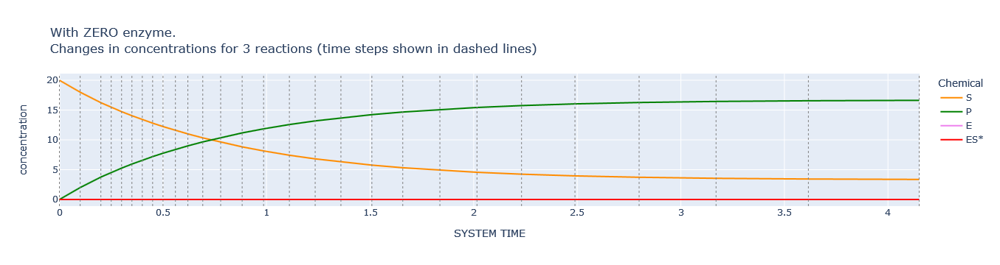

In [7]:
dynamics.plot_history(colors=['darkorange', 'green', 'violet', 'red'], show_intervals=True, title_prefix="With ZERO enzyme")

### The reactions, lacking enzyme, are proceeding slowly towards equilibrium, just like the reaction that was discussed in part 1 of the experiment "enzyme_1"

#### Locate the intersection of the curves for [S] and [P]:

In [8]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=1.0)

(0.7322948238817497, 10.0)

In [9]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(tolerance=2)

0: S <-> P
Final concentrations: [P] = 16.63 ; [S] = 3.37
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.93491
    Formula used:  [P] / [S]
2. Ratio of forward/reverse reaction rates: 5.00000519021548
Discrepancy between the two values: 1.302 %
Reaction IS in equilibrium (within 2% tolerance)

1: E + S <-> ES*
Final concentrations: [S] = 3.37 ; [E] = 0 ; [ES*] = 0
Reaction IS in equilibrium because it can't proceed in either direction due to zero concentrations in both some reactants and products!

2: ES* <-> E + P
Final concentrations: [ES*] = 0 ; [E] = 0 ; [P] = 16.63
Reaction IS in equilibrium because it can't proceed in either direction due to zero concentrations in both some reactants and products!



True

# 2. Re-start all the reactions from the same initial concentrations - except for now having a tiny amount of enzyme (two orders of magnitude less than the starting [S])

In [10]:
dynamics = ReactionDynamics(chem_data=chem_data)      # A brand-new simulation, with the same chemicals and reactions as before 

In [11]:
dynamics.set_conc(conc={"S": 20., "P": 0., "E": 0.2, "ES*": 0.},
                  snapshot=True)      # A tiny bit of enzyme `E`: 1/100 of the initial [S]
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 0.2
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'S', 'P', 'E'}


### Re-take the new system (now with a tiny amount of enzyme) to equilibrium

In [12]:
# These settings can be tweaked to make the time resolution finer or coarser.  
# Here we use a "slower" heuristic: very conservative about taking larger steps
dynamics.use_adaptive_preset(preset="slower")

dynamics.single_compartment_react(duration=1.5, 
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=5e-05, and will rewind there]
1574 total step(s) taken


In [13]:
#dynamics.explain_time_advance()

plot_curves() WARNING: Excessive number of vertical lines (1575) - only showing 1 every 11 lines


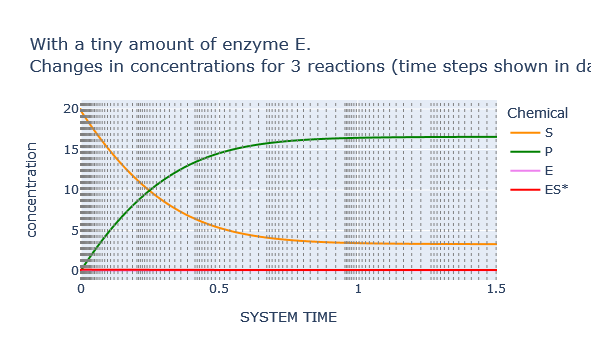

In [14]:
dynamics.plot_history(colors=['darkorange', 'green', 'violet', 'red'], show_intervals=True, title_prefix="With a tiny amount of enzyme E")

#### Locate the intersection of the curves for [S] and [P]:

In [15]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=1.0)

(0.24856557905040474, 9.926581378605173)

#### As mentioned earlier, the forward rates of the catalyzed reactions were tweaked, to produce a crossover time (with this initial [E]) close to what we had in the simpler model used in experiment `enzyme_3`

## Notice how even a tiny amount of enzyme (1/100 of the initial [S])  makes a very pronounced difference!

In [16]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium()

0: S <-> P
Final concentrations: [P] = 16.56 ; [S] = 3.32
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.98751
    Formula used:  [P] / [S]
2. Ratio of forward/reverse reaction rates: 5.00000519021548
Discrepancy between the two values: 0.25 %
Reaction IS in equilibrium (within 1% tolerance)

1: E + S <-> ES*
Final concentrations: [S] = 3.32 ; [E] = 0.08064 ; [ES*] = 0.1194
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 0.445758
    Formula used:  [ES*] / ([E][S])
2. Ratio of forward/reverse reaction rates: 0.44628794847605113
Discrepancy between the two values: 0.1187 %
Reaction IS in equilibrium (within 1% tolerance)

2: ES* <-> E + P
Final concentrations: [ES*] = 0.1194 ; [E] = 0.08064 ; [P] = 16.56
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 11.1888
    Formula used:  ([E][P]) / [ES*]
2. Ratio of forward/reverse reaction rates: 11.203540690016622
Discrepancy between the two values: 0.1315 %
Rea

True

Interestingly, most of the inital [E] of 0.2 is now, at equilibrium, stored as [ES*]=0.1194; the energy of the "activation barrier" from E + S to ES* might be unrealistically low (2000 Joules).  Zooming in on the very earl part of the plot:

plot_curves() WARNING: Excessive number of vertical lines (1575) - only showing 1 every 11 lines


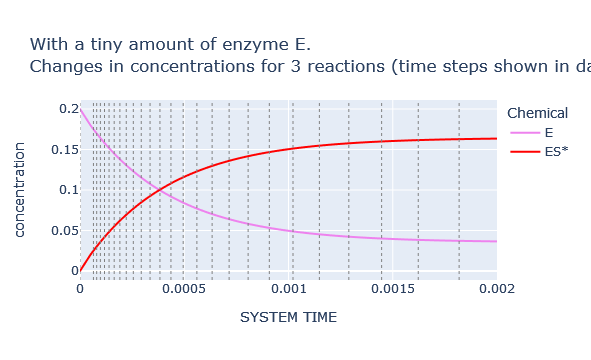

In [17]:
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix="With a tiny amount of enzyme E", xrange=[0., 0.002])

# 3. Stop when [P] reaches a particular threshold

The equilibrium concentrations of P is 16.666 and that of S is 3.333  
We'll stop the simulation when [P] first rises above 70% of its equilibrium concentrations

In [18]:
P_threshold = 16.666 * 0.7
P_threshold

11.6662

In [19]:
dynamics = ReactionDynamics(chem_data=chem_data)   # A brand-new simulation, with the same chemicals and reactions as before 

In [20]:
dynamics.set_conc(conc={"S": 20., "P": 0., "E": 0.2, "ES*": 0.},
                  snapshot=True)      # A tiny bit of enzyme `E`.  Same as in the previous run
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 0.2
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'S', 'P', 'E'}


In [21]:
# These settings can be tweaked to make the time resolution finer or coarser.  
# Here we use a "slower" heuristic: very conservative about taking larger steps
dynamics.use_adaptive_preset(preset="slower")

# Instead of specifying a desired duration, like done before, we specify a termination criterion
dynamics.single_compartment_react(stop=("conc_above", ("P", P_threshold)), max_steps=10000, 
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=5e-05, and will rewind there]
868 total step(s) taken


plot_curves() WARNING: Excessive number of vertical lines (869) - only showing 1 every 6 lines


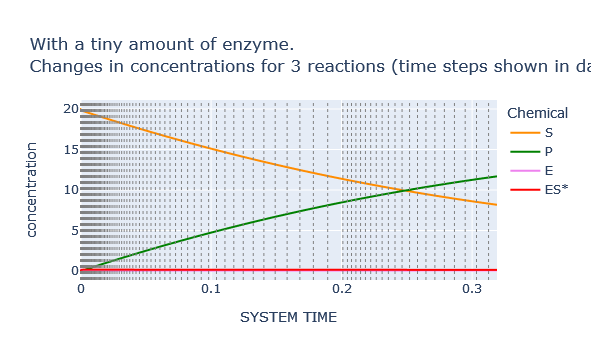

In [22]:
dynamics.plot_history(colors=['darkorange', 'green', 'violet', 'red'], show_intervals=True, title_prefix="With a tiny amount of enzyme")

In [23]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=1.0)  # This will be the same as in the previous step, as a double-check

(0.24856557905040474, 9.926581378605173)

In [24]:
dynamics.get_history()

,SYSTEM TIME,S,P,E,ES*,caption
0,0.000000,20.000000,0.000000,0.200000,0.000000,Initial state
1,0.000050,19.979000,0.001000,0.180000,0.020000,
2,0.000053,19.978062,0.001060,0.179122,0.020878,
3,0.000054,19.977596,0.001090,0.178686,0.021314,
4,0.000055,19.977126,0.001121,0.178247,0.021753,
...,...,...,...,...,...,...
864,0.312624,8.317876,11.540092,0.057968,0.142032,
865,0.314218,8.282160,11.575925,0.058084,0.141916,
866,0.315828,8.246291,11.611911,0.058202,0.141798,
867,0.317455,8.210273,11.648048,0.058320,0.141680,


#### Notice how the simulation got automatically stopped as soon as [P] rose over P_threshold = 11.6662

In [25]:
dynamics.reach_threshold(chem="P", threshold=P_threshold)

0.31827656508118246

# 4. Repeat last step with increasingly-larger [E]

In [38]:
dynamics = ReactionDynamics(chem_data=chem_data)   # A brand-new simulation, with the same chemicals and reactions as before 

In [39]:
dynamics.set_conc(conc={"S": 20., "P": 0., "E": 0.4, "ES*": 0.},
                  snapshot=True)      # A tiny bit of enzyme `E`.  Same as in the previous run
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 0.4
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'S', 'P', 'E'}


In [40]:
# These settings can be tweaked to make the time resolution finer or coarser.  
dynamics.use_adaptive_preset(preset="slower")

In [41]:
# We specify a termination criterion
dynamics.single_compartment_react(stop=("conc_above", ("P", P_threshold)), max_steps=10000, 
                                  initial_step=0.000025, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=2.5e-05, and will rewind there]
810 total step(s) taken


plot_curves() WARNING: Excessive number of vertical lines (811) - only showing 1 every 6 lines


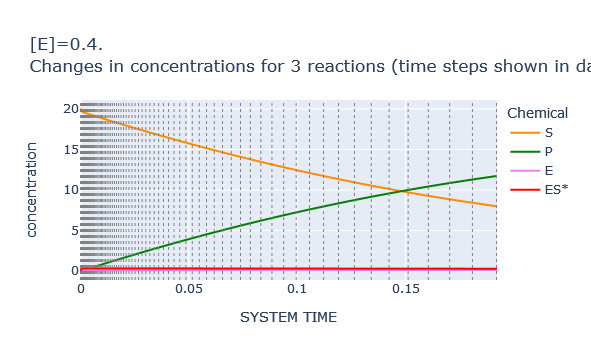

In [42]:
dynamics.plot_history(colors=['darkorange', 'green', 'violet', 'red'], show_intervals=True, title_prefix="[E]=0.4")

In [43]:
dynamics.reach_threshold(chem="P", threshold=P_threshold)

0.19044594595141753

In [45]:
E_conc = 0.6

In [46]:
dynamics = ReactionDynamics(chem_data=chem_data)   # A brand-new simulation, with the same chemicals and reactions as before 
dynamics.set_conc(conc={"S": 20., "P": 0., "E": E_conc, "ES*": 0.}, snapshot=True)

In [47]:
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 0.6
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'S', 'P', 'E'}


In [48]:
# These settings can be tweaked to make the time resolution finer or coarser.  
dynamics.use_adaptive_preset(preset="slower")

In [49]:
# We specify a termination criterion
dynamics.single_compartment_react(stop=("conc_above", ("P", P_threshold)), max_steps=10000, 
                                  initial_step=0.000025, variable_steps=True, silent=True)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=2.5e-05, and will rewind there]
776 total step(s) taken


plot_curves() WARNING: Excessive number of vertical lines (777) - only showing 1 every 6 lines


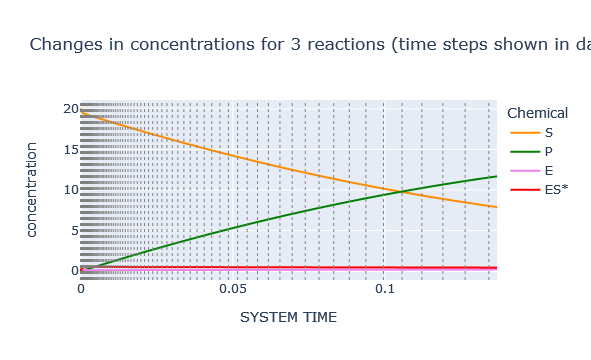

In [51]:
dynamics.plot_history(colors=['darkorange', 'green', 'violet', 'red'], show_intervals=True)

In [52]:
dynamics.reach_threshold(chem="P", threshold=P_threshold)

0.13646597797009238

In [80]:
E_conc = 100

In [82]:
dynamics = ReactionDynamics(chem_data=chem_data)   # A brand-new simulation, with the same chemicals and reactions as before 

dynamics.set_conc(conc={"S": 20., "P": 0., "E": E_conc, "ES*": 0.}, snapshot=True)

# These settings can be tweaked to make the time resolution finer or coarser.  
dynamics.use_adaptive_preset(preset="slower")

# We specify a termination criterion
dynamics.single_compartment_react(stop=("conc_above", ("P", P_threshold)), max_steps=10000, 
                                  initial_step=0.00001, variable_steps=True, silent=False)

dynamics.reach_threshold(chem="P", threshold=P_threshold)

* INFO: the tentative time step (5e-06) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 5e-07) [Step started at t=1e-05, and will rewind there]
* INFO: the tentative time step (5e-07) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 5e-08) [Step started at t=1e-05, and will rewind there]

*** CAUTION: negative concentration in chemical `E` in step starting at t=52.8.  It will be AUTOMATICALLY CORRECTED with a reduction in time step size, as follows:
    INFO: the tentative time step (0.52281) leads to a NEGATIVE concentration of `E` from reaction E + S <-> ES* (rxn # 1): 
      Baseline value: 82.815 ; delta conc: -89.635
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 0.052281) [Step started at t=52.804, and will rewind there]

*** CAUTION: nega

plot_curves() WARNING: Excessive number of vertical lines (10001) - only showing 1 every 67 lines


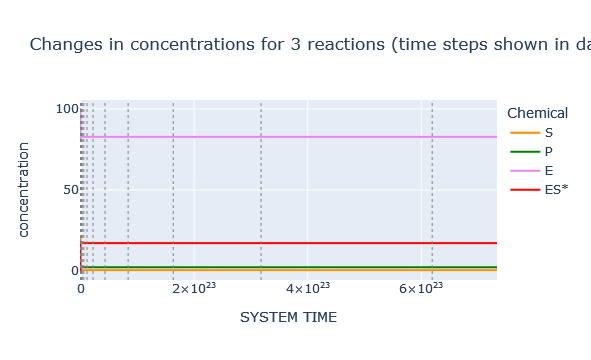

In [84]:
dynamics.plot_history(colors=['darkorange', 'green', 'violet', 'red'], show_intervals=True)

In [85]:
dynamics.reach_threshold(chem="P", threshold=P_threshold)